# P1: Convolutions, Fourier Transforms, and Image Pyramids

This is the first programming assignment you will be asked to complete in the course. As we are just starting off, I have tried to keep this assignment to a manageable size (especially since many of us are working remotely and on different schedules). In the future, I will give you assignments that are a bit more open-ended, and encourage you to try different options, discover which are more effective for different tasks, and explain the decisions you have made. Since this is the beginning of the class, this assignment is a bit more formulaic.

You are *required* to LaTeX your solutions to this assignment and use the 10pt, 2-column `ieeeconf` template. You can find the template [on Overleaf](https://www.overleaf.com/latex/templates/preparation-of-papers-for-ieee-sponsored-conferences-and-symposia/zfnqfzzzxghk); Overleaf is an online LaTeX editor with a free tier, so feel free to use that service to compose your writeups. It is perhaps the easiest option, particularly if you are not as familiar with LaTeX. The space limit for this assignment is **4 pages maximum**. While I don't expect this limit will pose a particular challenge for this assignment, in the future I hope that it will encourage you to think more carefully about what results you choose to include and to be more clear and succinct with your writing. You are allowed to work in small groups (2 or 3 students), but your solutions and your writeup should be your own.

With these homework assignments, I expect that your solutions will be written as if they are research papers: though the content is not "new", you should be trying to convince me through your writing that you have implemented and understand the algorithms. You should write in full sentences. When appropriate, comment on when the algorithms succeed or fail and where they are more or less effective; include numbers/metrics (quantitative) in addition to discussion (qualitative) whenever possible. If I ask you to compare two algorithms or approaches, you should be thorough in your comparison, using numbers in addition to qualitative explanations whenever possible. For example, at the end of P1.2.2, I ask you to compare different upsampling algorithms. Your response should include a discussion (in words) about how they are similar and different, but might also include a quantitative comparison: *by how much* do each of the upsampling algorithms differ from the original image? The [L2-norm](https://mathworld.wolfram.com/L2-Norm.html) might be meaningful to include.

Just like in a published paper, you should not include code snippets in your writeup unless it is explicitly asked for or you think it helps you explain your results or answer the question. **I will ask you to submit both the PDF of your writeup *and* a .zip file containing your code (which may be a modified form of this Jupyter notebook) on Blackboard**. Though it would be nice if your code were cleaned up and nicely formatted/commented, we will not likely execute your code unless we are skeptical for academic integrity reasons. We may also use your code to evaluate partial credit on multi-part assignments.

In [326]:
"""All the required library files are imported here """
import numpy as np
import math
import matplotlib.pyplot as plt
import scipy.interpolate
import scipy.signal
from PIL import Image
from numpy.fft import fft2, ifft2, fftshift, ifftshift
import math
import matplotlib.image as mi
import scipy.signal
from scipy import ndimage
from skimage.transform import pyramid_gaussian

In [274]:
"""Function to load the image from the filepath and store it as a numpy array"""
def load_image(filepath):
    image = Image.open(filepath)
    return (np.asarray(image).astype(np.float)/255)[:, :, :3]

## P1.1 Getting Started With Filtering

In this first assignment, you will be writing functions to generate your own image filters and using them to process images. For this problem, **you are encouraged to use an image of your own choosing** (with a size of roughly 500px along either dimension), but you are also free to use the image I have provided.

**You do not need to implement the convolution yourself.** Your version will be slower than the version built in to `scipy.signal`, which you are welcome to use. I have provided you with some simple code to get you started:

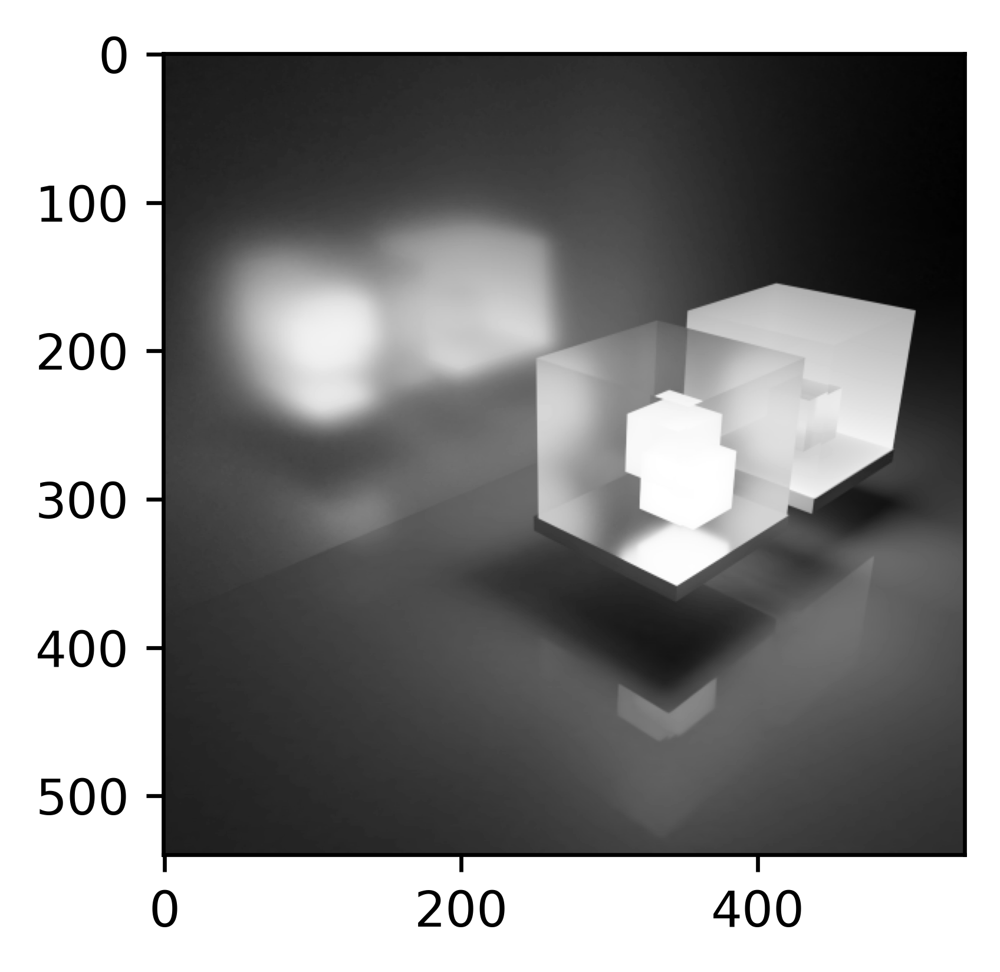

In [275]:
"""We are loading a sample image as numpy array"""
image = load_image("light_cubes_sm.png")[:, :, 0]

"""This is an Indentity filter which has no effect on the image and reproduces the original image as such"""
identity_filter = [[ 0, 0, 0 ], [ 0, 1, 0 ],[ 0, 0, 0 ]]

"""We use the inbuilt convolve2d between our original image and the Identity filter"""
filtered_image = scipy.signal.convolve2d(image, identity_filter, mode='same')

"""Plot the resulting image after covolution """
fig = plt.figure(figsize=(3, 3), dpi=600)
plt.imshow(filtered_image, cmap = "gray")
None

In [276]:
"""Differet filters which are given for implementation"""
filter_a = np.asarray([[ 1, 1, 1 ], [ 1, 1, 1 ],[ 1, 1, 1 ]])*(1/9)

filter_b = np.asarray([[ 0, 0, 0 ], [ 1, 1, 1 ],[ 0, 0, 0 ]])*(1/3)

filter_c = np.asarray([[ -1, 0, 1 ],[ -1, 0, 1 ],[ -1, 0, 1 ]])*(1/6)

filter_d = np.asarray([[ 1, 0, 0 ],[ 0, 1, 0 ],[ 0, 0, 1 ]])*(1/3)


In [277]:
"""Function which applies a given filter and plot the resulting image after convolution"""
def plot_filtered_image(filters):
    filtered_image = scipy.signal.convolve2d(image, filters, mode='same')
    fig = plt.figure(figsize=(3, 3), dpi=600)
    plt.imshow(filtered_image, cmap="gray")
    None

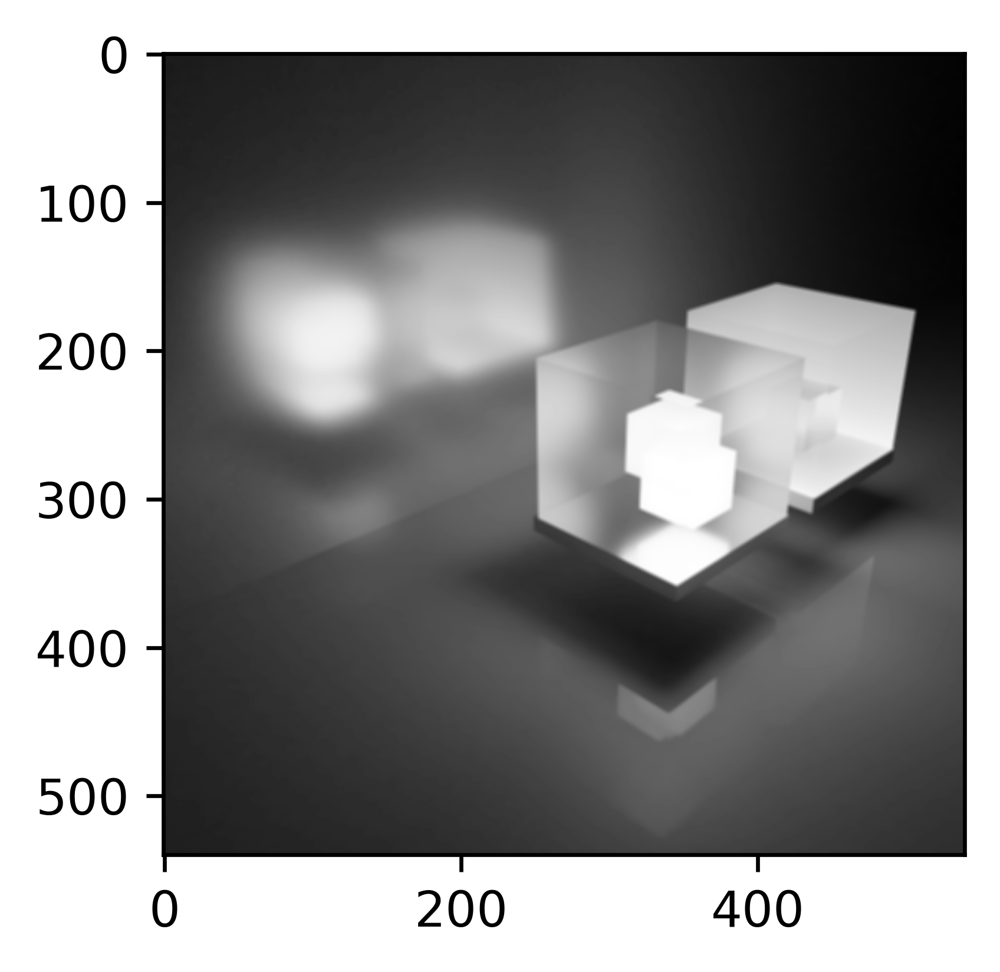

In [278]:
plot_filtered_image(filter_a)

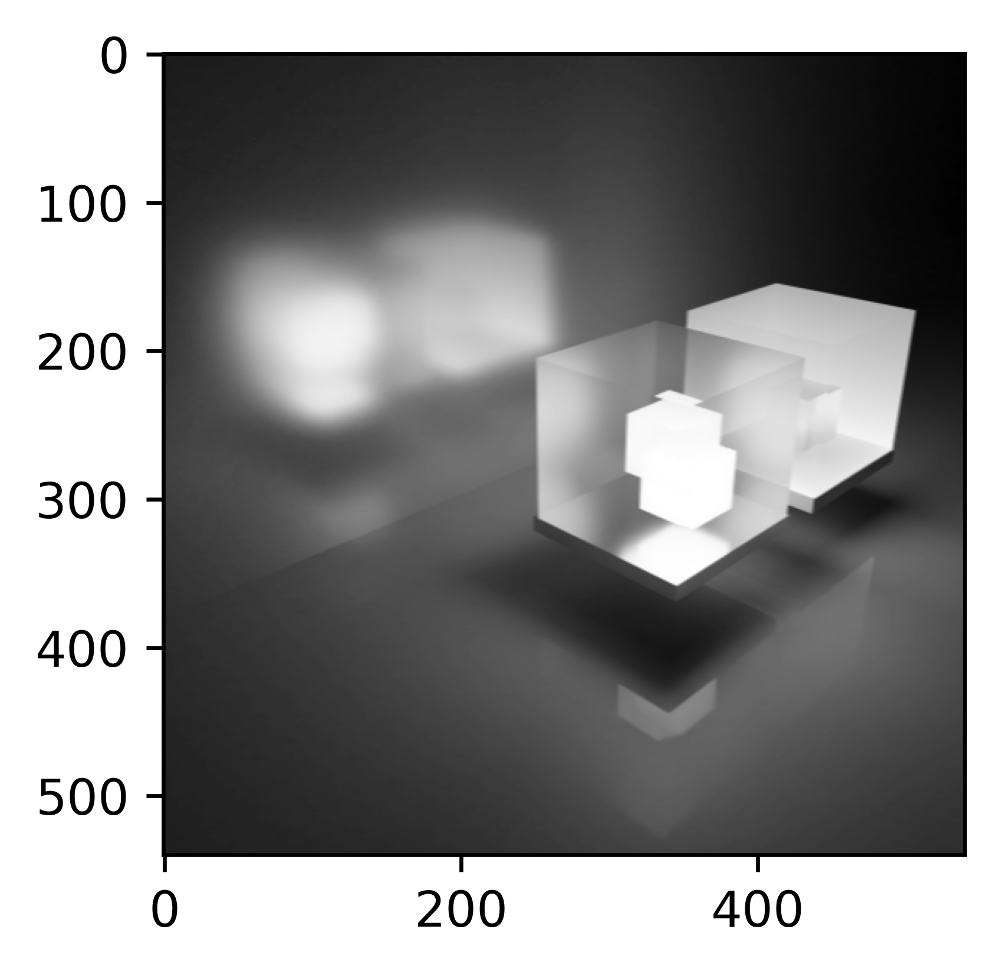

In [279]:
plot_filtered_image(filter_b)

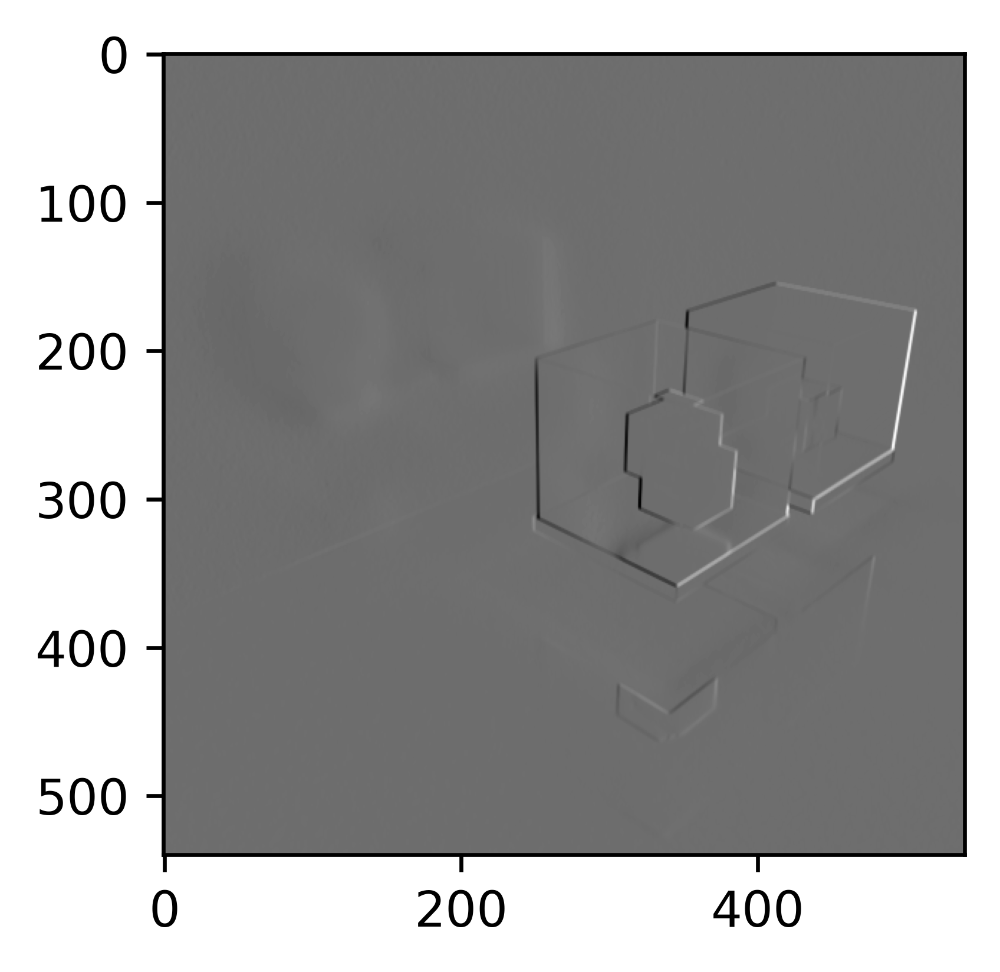

In [280]:
plot_filtered_image(filter_c)

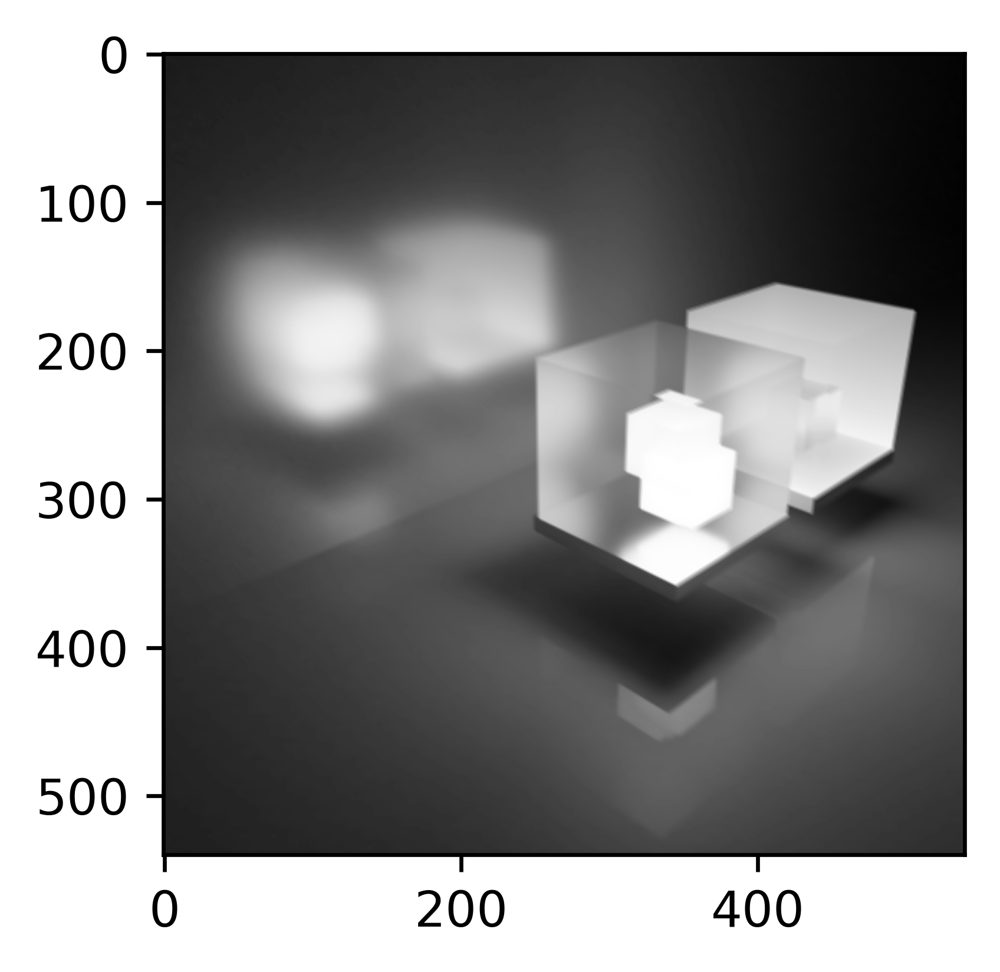

In [281]:
plot_filtered_image(filter_d)

### P1.1.1 Some Simple Filters

Apply the following filters to your image and plot them. For each, describe the effects the filter has on the image (and name it if you've seen it before). Which filters are *separable*? For the separable filters, write their components parts:

$$f_a = \frac{1}{9}\begin{bmatrix} 
    1 & 1 & 1 \\
    1 & 1 & 1 \\
    1 & 1 & 1 \end{bmatrix} $$
    
$$f_b = \frac{1}{3}\begin{bmatrix} 
    0 & 0 & 0 \\
    1 & 1 & 1 \\
    0 & 0 & 0 \end{bmatrix} $$

$$f_c = \frac{1}{6}\begin{bmatrix} 
    -1 & 0 & 1 \\
    -1 & 0 & 1 \\
    -1 & 0 & 1 
    \end{bmatrix} $$
    
$$f_d = \frac{1}{3}\begin{bmatrix} 
    1 & 0 & 0 \\
    0 & 1 & 0 \\
    0 & 0 & 1 
    \end{bmatrix} $$


### P1.1.2 Image Derivatives

Plot the following for the images you have chosen:
- The image derivatives $I_x$ and $I_y$, computed using the vertical and horizontal Sobel filters.
- Using $I_x$ and $I_y$, compute the image gradient magnitude and angle; include figures of both.
- Using a finite-difference method, derive a filter for the image Laplacian: $$\nabla^2 I = \frac{\partial^2 I}{\partial x^2} + \frac{\partial^2 I}{\partial y^2}$$ Compute and plot the laplacian for your image (and include the definition of your Laplacian filter).

Be sure to title your plots so that it is clear which plot is which. 

*Note*: Be attentive with your color schemes for your plots. When plotting image derivatives, using a color map like `gray` or `viridis` assigns a middle value to a non-recognizable color somewhere in the middle of the spectrum. You might want to look into a *diverging color map* like `PiYG` and set the `vmin` and `vmax` args for `imshow` so that the zero-crossing is a *special value* of pure white. See the [matplotlib guide on colormaps](https://matplotlib.org/3.3.0/tutorials/colors/colormaps.html) for more details.

### P1.1.3 Gaussian Filtering

Compute a discrete Gaussian Filter by completing the function `get_gaussian_filter` defined below. Compute filters of three different $\sigma$ values and apply them to your image (you should be able to see the difference in amount of blur between them). Plot the filters alongside the images they are used to generate. Be sure that the filter width is large enough that it does not meaningfully impact the output (a standard convention is to ensure that the filter width is at least $3\sigma$). What would happen if the filter width were too small compared to $\sigma$? You may answer in words, though a figure would also be acceptable.

In class, we defined a `3x3` Gaussian filter as follows:
$$g = \frac{1}{16}\begin{bmatrix} 1 & 2 & 1 \\ 2 & 4 & 2 \\ 1 & 2 & 1 \end{bmatrix}$$
What is the $\sigma$ of this filter?

### P1.1.4 Derivative of Convolution

In class, we discussed the derivative of convolution theorem:

$$ \frac{\partial }{\partial x} (f * h) = \frac{\partial f}{\partial x} * h $$

Show empirically that this theorem holds on your image.

In [282]:
"""Computing the image derivatives Ix and Iy using Sobel filter"""
img_dx = ndimage.sobel(image, 0)  
img_dy = ndimage.sobel(image, 1) 

"""Computing the Gradient magnitude of the image"""
grad_mag = np.hypot(img_dx, img_dy) 
grad_mag *= 255.0 / np.max(grad_mag)

"""Computing the Gradient angle of the image"""
img_dy_dx = np.divide(img_dy, img_dx, out=np.zeros_like(img_dy), where = (img_dx!=0))
grad_ang = np.arctan(img_dy_dx)

In [283]:
"""Function for plotting the image"""
def show_img(image):
    fig = plt.figure(figsize=(3, 3), dpi=600)
    plt.imshow(image,cmap = "PiYG")

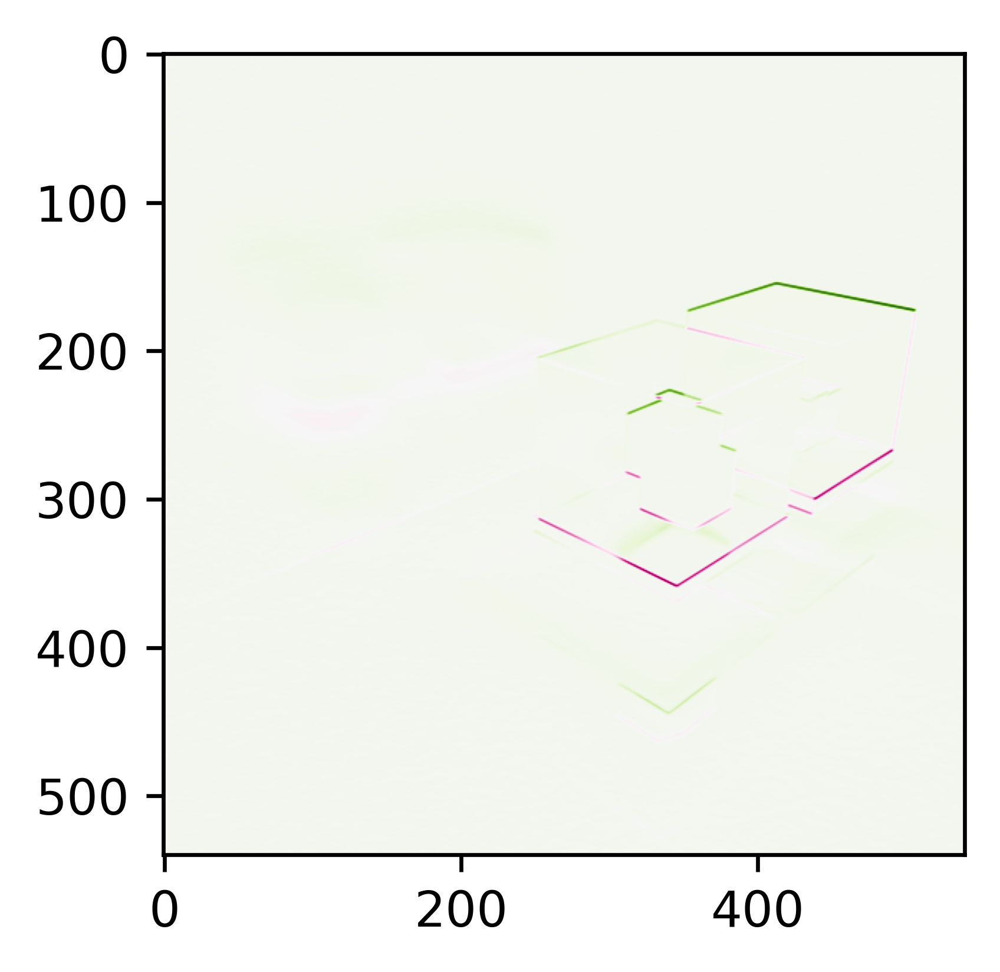

In [284]:
show_img(img_dx)

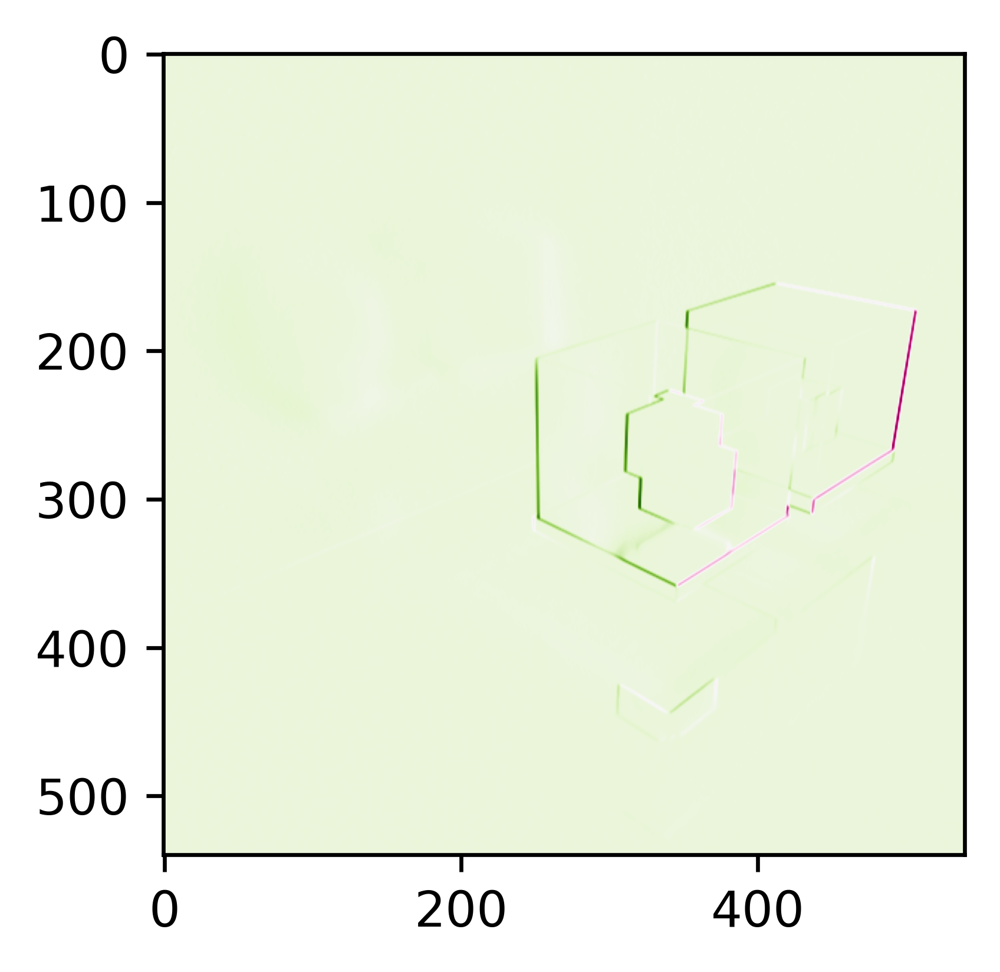

In [285]:
show_img(img_dy)

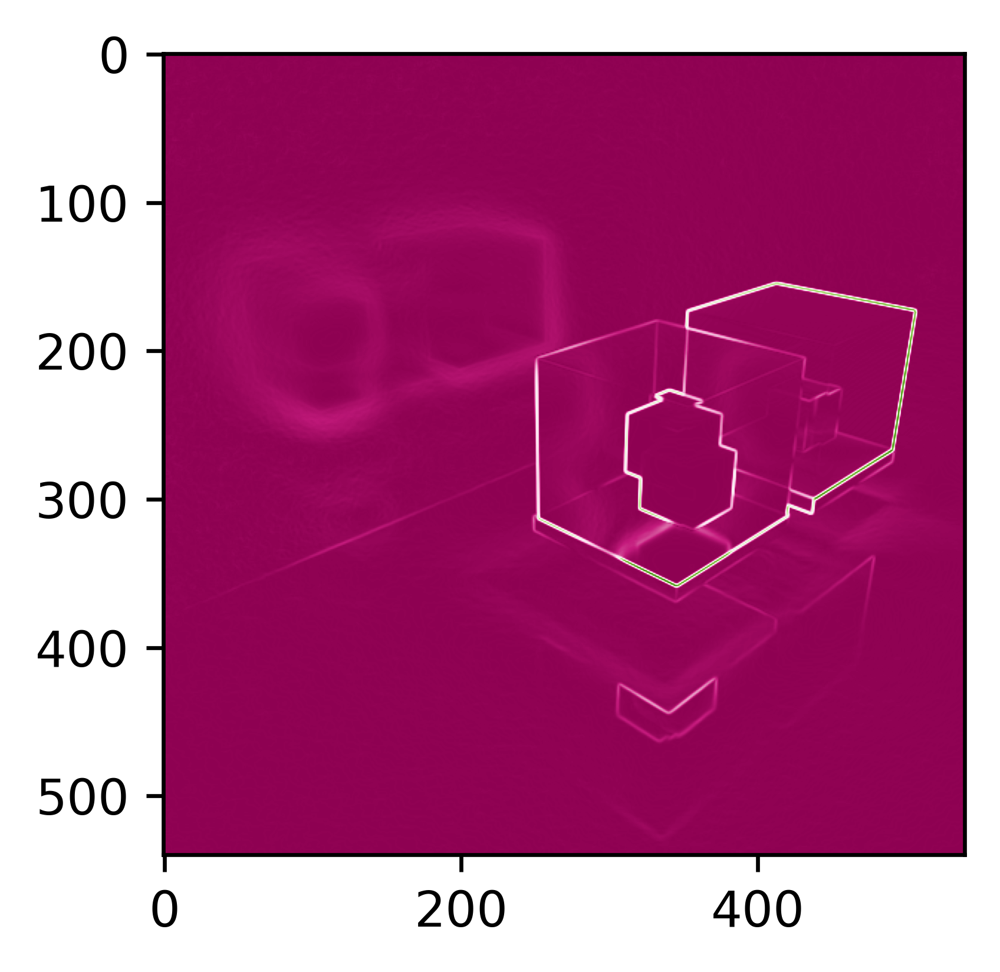

In [286]:
show_img(grad_mag)

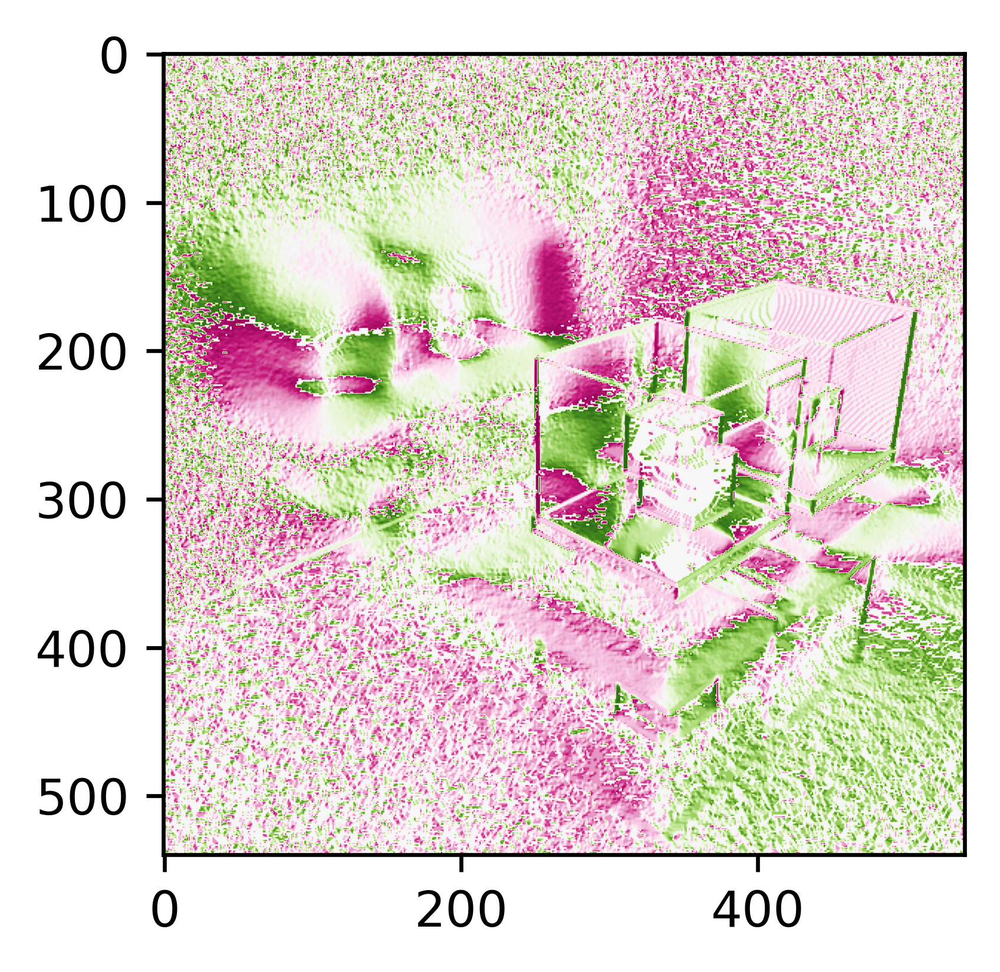

In [287]:
show_img(grad_ang)

In [288]:
"""Different Laplacian filters"""
laplace_diagnol_filter = np.asarray([[ -1, -1, -1 ], [ -1, 8, -1 ],[ -1, -1, -1 ]])

laplace_filter = np.asarray([[ 0, -1, 0 ],[ -1, 4, -1 ],[ 0, -1, 0 ]])

laplace_5x5_filter = np.asarray([[ -1, -1, -1, -1, -1 ],[ -1, -1, -1, -1, -1 ],[ -1, -1, 24, -1, -1 ],[ -1, -1, -1, -1, -1 ],[ -1, -1, -1, -1, -1 ]])

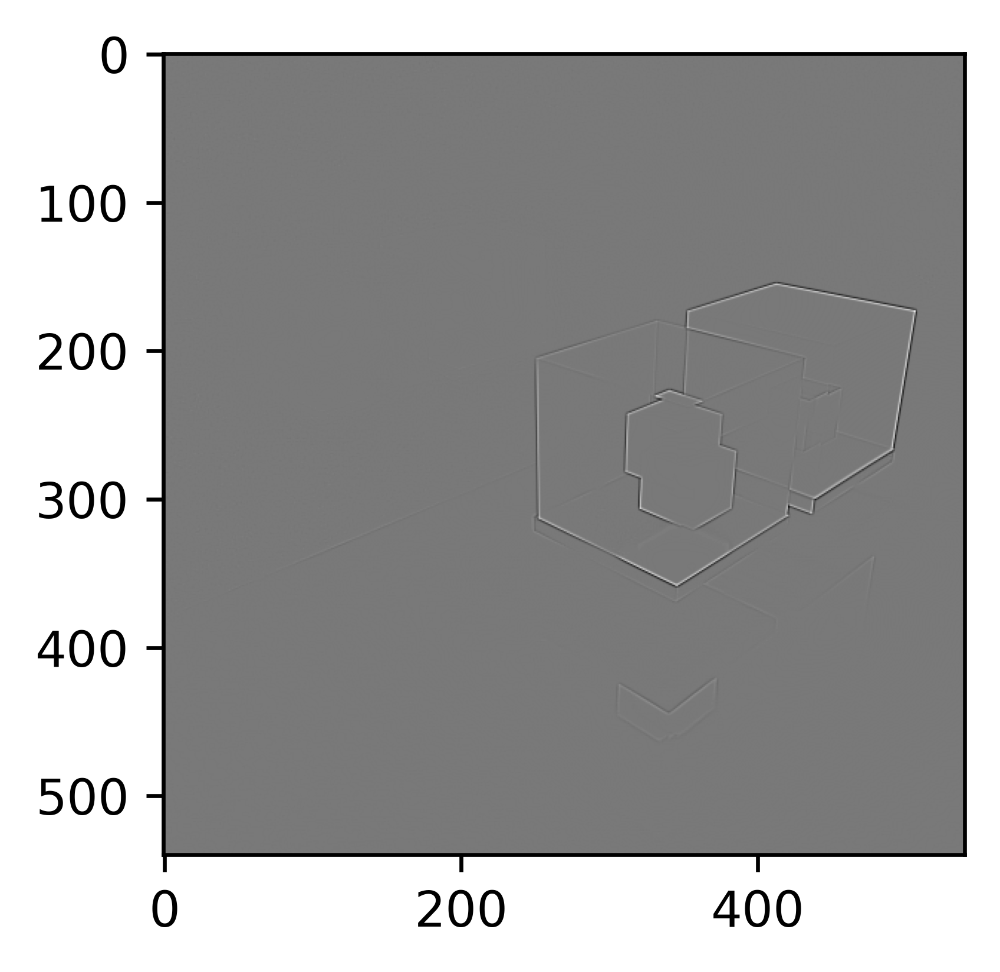

In [289]:
plot_filtered_image(laplace_diagnol_filter)

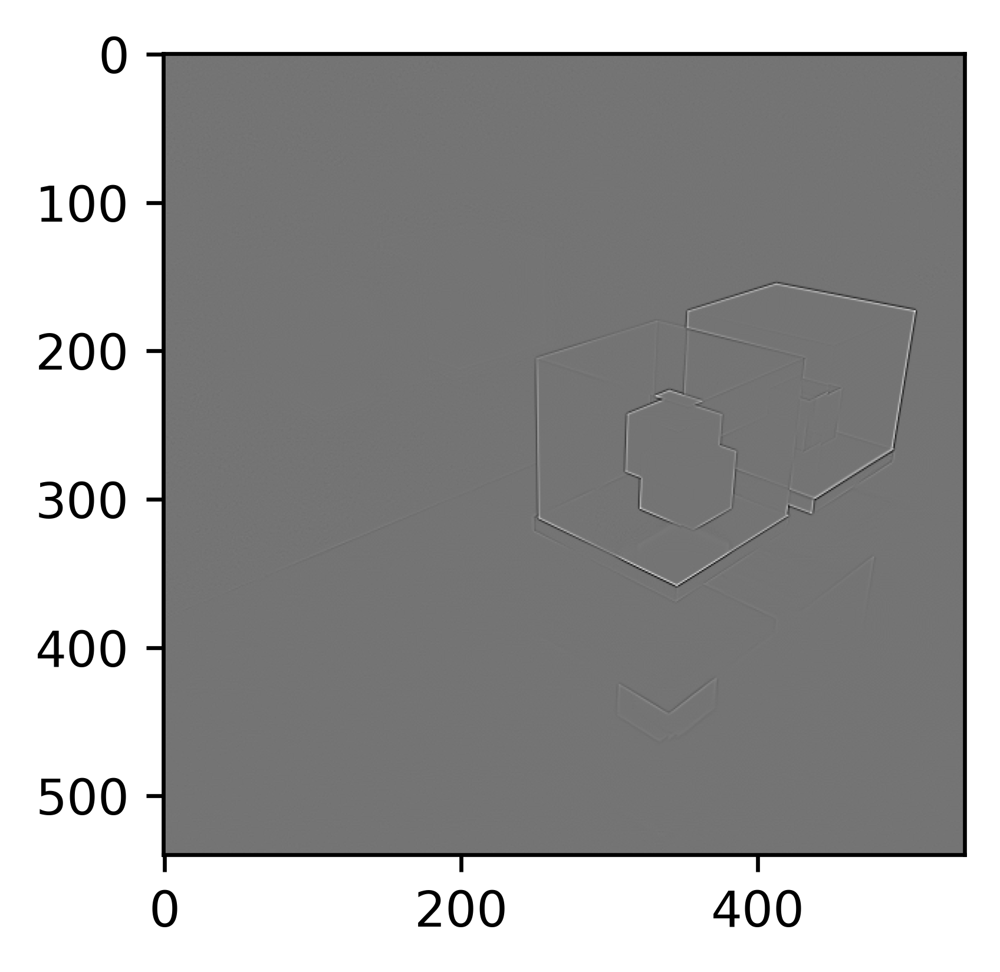

In [290]:
plot_filtered_image(laplace_filter)

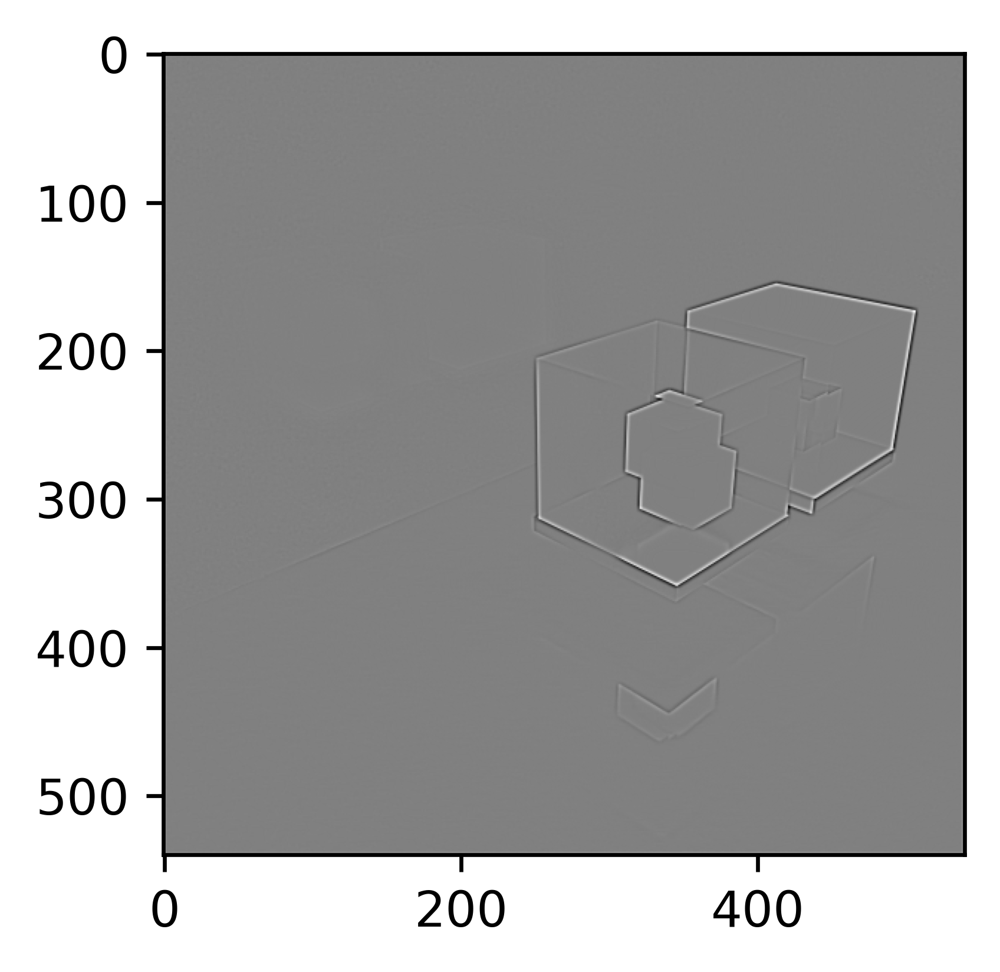

In [291]:
plot_filtered_image(laplace_5x5_filter)

In [302]:
"""Implementation of Gaussian filter"""
"""Calculating the filter values using the Gaussian distribution formula"""  
def get_gaussian_filter(filter_width,sigma):
    gaussian_filter = np.zeros((filter_width, filter_width), np.float32)
    m = filter_width//2
    n = filter_width//2
    for x in range(-m, m+1):
        for y in range(-n, n+1):
            x1 = 2*np.pi*(sigma**2)
            x2 = np.exp(-(x**2 + y**2)/(2* sigma**2))
            gaussian_filter[x+m, y+n] = (1/x1)*x2
    assert(filter_width % 2 == 1)
    return gaussian_filter
    raise NotImplementedError()

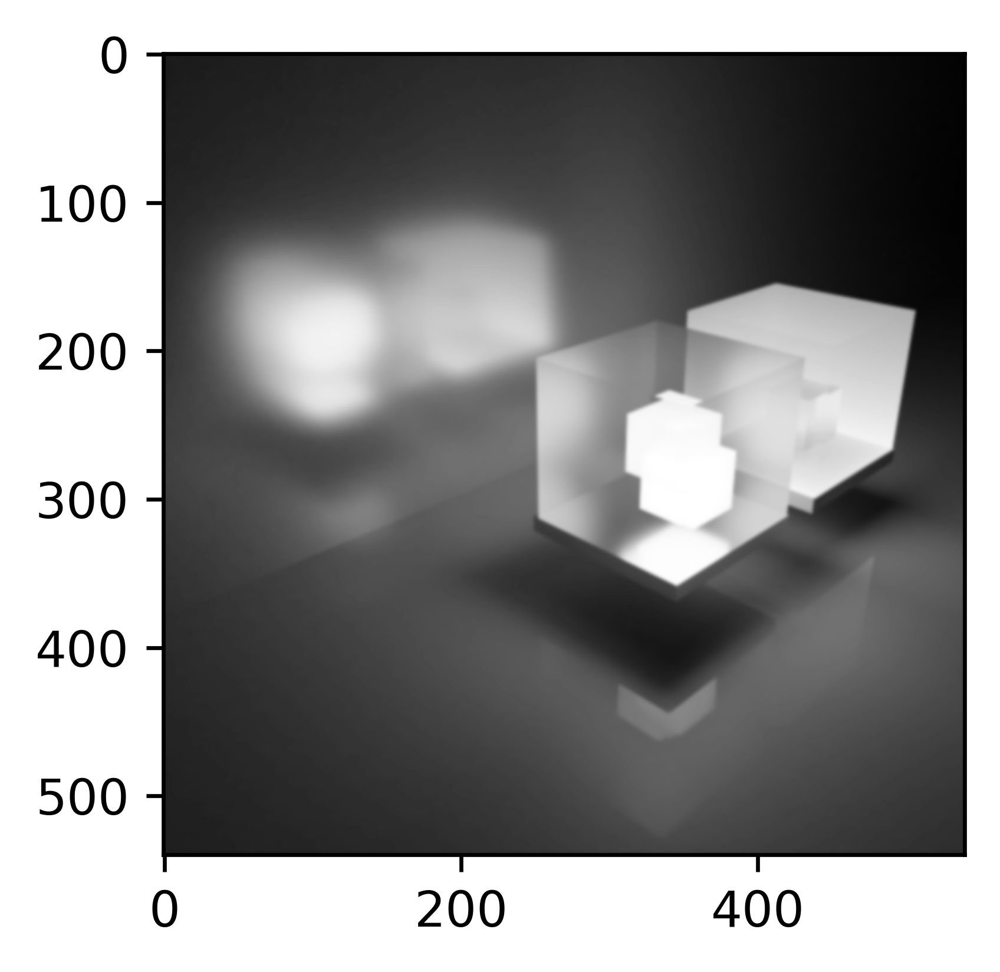

In [303]:
"""Generating Gaussian filter for sigma = 1"""
"""The filter width is calculated based on the given sigma value which is approximately >= 6*sigma"""
sigma = 1
filter_size = 2 * int(4 * sigma + 0.5) + 1
gauss_filter = get_gaussian_filter(filter_size,sigma)
plot_filtered_image(gauss_filter)

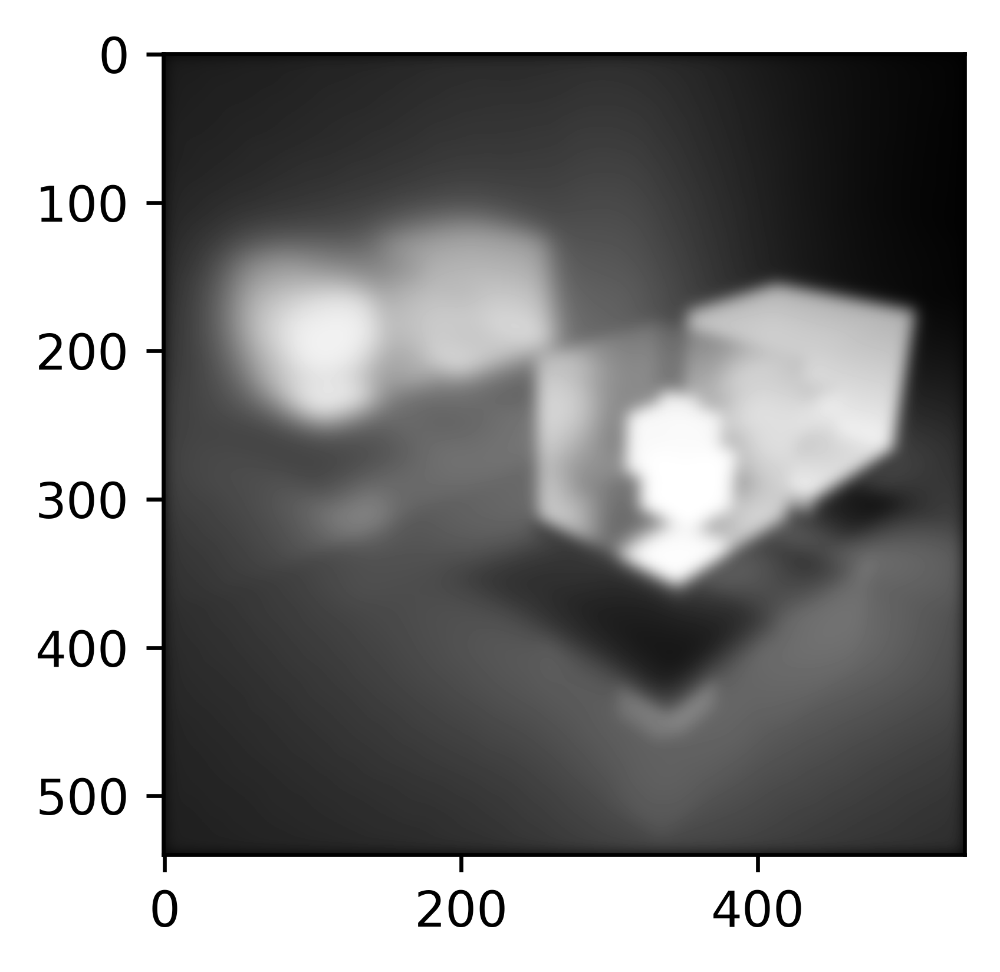

In [304]:
"""Generating Gaussian filter for sigma = 5"""
sigma = 5
filter_size = 2 * int(4 * sigma + 0.5) + 1
gauss_filter = get_gaussian_filter(filter_size,sigma)
plot_filtered_image(gauss_filter)

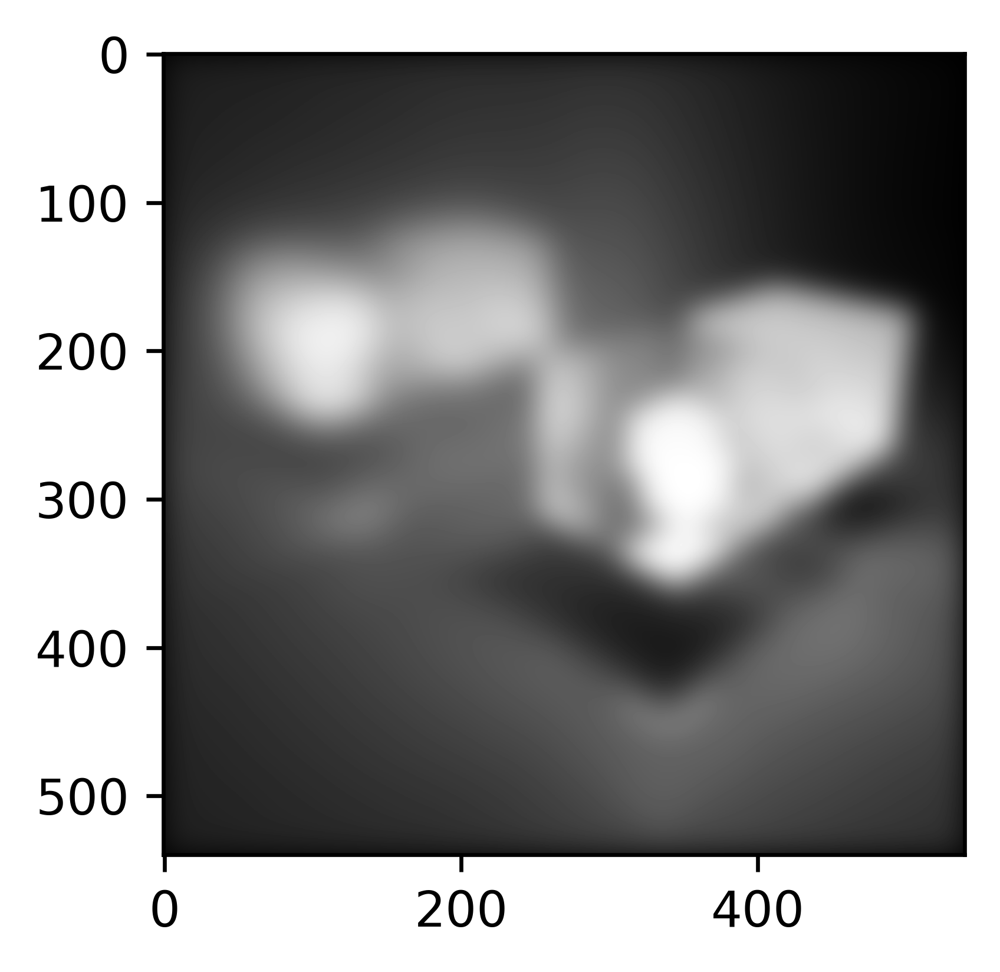

In [305]:
"""Generating Gaussian filter for sigma = 10"""
sigma = 10
filter_size = 2 * int(4 * sigma + 0.5) + 1
gauss_filter = get_gaussian_filter(filter_size,sigma)
plot_filtered_image(gauss_filter)

## P1.2 Image Upsampling

In class, we discussed *Image Upsampling*, the process of making larger images from smaller ones by interpolating between the discrete pixel values. Upsampling (and the interpolation process) will become quite relevant in a few weeks when we discuss image warping. As such, you should make sure that these functions are well-documented and you can easily reuse them: **you will need them again**.

### P1.2.1 Upsampling Kernels

In this part of the problem, you will be asked to upsample an image using some of the interpolation strategies we discussed in class. I have provided an image and its downsampled version.

Your task is to complete the `interp_STRATEGY` functions I have provided below. For each function, you are asked to provide the original image and the `new_x` and `new_y` values at which you would like the new value. I have provided you with the `upsample_image` function that will use the interpolation function you will create. Make sure you understand what is going on in that function. In particular, I have used the `np.ndenumerate` function to loop through the numpy arrays and the `image[y, x]` convention (since the image is stored as `[rows, columns]`).

I recommend that you begin by implementing an interpolation function that works on a 1-dimensional signal before attempting to upsample a 2-dimensional image. Feel free to include plots of the 1D interpolation if you feel it is helpful to your writeup.

Implement the three different interpolation strategies listed below: *nearest neighbor*, *bilinear*, and *bicubic* (See Ch 3.5 in Szeliski for a discussion of these strategies). Note that *bicubic* interpolation requires selecting a *boundary condition* for points outside the image; feel free to choose a "zero" boundary condition: i.e. return 0 whenever a point outside the image is requested. After interpolation, confirm that downsampling your upsampled image recovers your uninterpolated image for each upsampling function.

In [306]:
def upsample_image(image, target_shape, interp_fn):
    """Initialize the upsampled image to zeros"""
    image_up = np.zeros(target_shape)
    
    """Define the new coordinates (using the [y, x] convention"""
    """since image matrices are defined [row, column])"""
    new_xs = np.linspace(0, image.shape[1]-1, 
                         target_shape[1], endpoint=True)
    new_ys = np.linspace(0, image.shape[0]-1, 
                         target_shape[0], endpoint=True)
    
    """Loop through coordinates and set the image values"""
    for ix, new_x in np.ndenumerate(new_xs):
        for iy, new_y in np.ndenumerate(new_ys):
            image_up[iy, ix] = interp_fn(image, new_x, new_y)
    return image_up

"""Function for Nearest Neighbor Interpolation"""
def interp_nn(image, new_x, new_y):
    """As the new coordinates have been defined using np.linspace, they are already equally distributed"""
    """So we just return the coordinates by rounding them to integer"""
    return image[int(new_y), int(new_x)]
    raise NotImplementedError()
    
"""Function for Bilinear Interpolation"""
def interp_bilinear(image, new_x, new_y):
    """Finding the points x1 and y1 from given x and y points"""
    x0 = np.floor(new_x).astype(int)
    x1 = x0 + 1
    y0 = np.floor(new_y).astype(int)
    y1 = y0 + 1
    
    """Clipping the values of x1 and y1 to make it within the range"""
    x0 = np.clip(x0, 0, image.shape[1]-1)
    x1 = np.clip(x1, 0, image.shape[1]-1)
    y0 = np.clip(y0, 0, image.shape[0]-1)
    y1 = np.clip(y1, 0, image.shape[0]-1)

    Ia = image[ y0, x0 ]
    Ib = image[ y1, x0 ]
    Ic = image[ y0, x1 ]
    Id = image[ y1, x1 ]

    wa = (x1-new_x) * (y1-new_y)
    wb = (x1-new_x) * (new_y-y0)
    wc = (new_x-x0) * (y1-new_y)
    wd = (new_x-x0) * (new_y-y0)

    return (Ia.T*wa).T + (Ib.T*wb).T + (Ic.T*wc).T + (Id.T*wd).T
    raise NotImplementedError()
    
"""Function for Weight matrix calculation in Bicubic Interpolation"""    
def weight_calc(point,a):
    if (abs(point) >=0) & (abs(point) <=1):
        return (a+2)*(abs(point)**3)-(a+3)*(abs(point)**2)+1
    elif (abs(point) > 1) & (abs(point) <= 2):
        return a*(abs(point)**3)-(5*a)*(abs(point)**2)+(8*a)*abs(point)-4*a
    return 0

"""Function for Bicubic Interpolation"""
def interp_bicubic(image, new_x, new_y):
    """Value of a ranges between -0.5 to -0.75"""
    a = -0.5
    
    """Finding the set of X points"""
    x1 = 1 + new_x - math.floor(new_x)
    x2 = new_x - math.floor(new_x)
    x3 = math.floor(new_x) + 1 - new_x
    x4 = math.floor(new_x) + 2 - new_x
    
    """Finding the set of Y points"""
    y1 = 1 + new_y - math.floor(new_y)
    y2 = new_y - math.floor(new_y)
    y3 = math.floor(new_y) + 1 - new_y
    y4 = math.floor(new_y) + 2 - new_y
    
    """Find the Weight Matrix for the X set of points"""
    weight_matrix_X = np.matrix([[weight_calc(x1,a),weight_calc(x2,a),weight_calc(x3,a),weight_calc(x4,a)]])
    
    """Finding the Coefficient Matrix """
    """Return zero if the point is outside the image boundary"""
    try:
        coeff_matrix = np.matrix([[image[int(new_y-y1),int(new_x-x1)],image[int(new_y-y2),int(new_x-x1)],image[int(new_y+y3),int(new_x-x1)],image[int(new_y+y4),int(new_x-x1)]],
                       [image[int(new_y-y1),int(new_x-x2)],image[int(new_y-y2),int(new_x-x2)],image[int(new_y+y3),int(new_x-x2)],image[int(new_y+y4),int(new_x-x2)]],
                       [image[int(new_y-y1),int(new_x+x3)],image[int(new_y-y2),int(new_x+x3)],image[int(new_y+y3),int(new_x+x3)],image[int(new_y+y4),int(new_x+x3)]],
                       [image[int(new_y-y1),int(new_x+x4)],image[int(new_y-y2),int(new_x+x4)],image[int(new_y+y3),int(new_x+x4)],image[int(new_y+y4),int(new_x+x4)]]])
    except:
        return 0.96470588
    
    """Find the Weight Matrix for the X set of points"""
    weight_matrix_Y = np.matrix([[weight_calc(y1,a)],[weight_calc(y2,a)],[weight_calc(y3,a)],[weight_calc(y4,a)]])
    
    return np.dot(np.dot(weight_matrix_X, coeff_matrix),weight_matrix_Y)
    raise NotImplementedError()


In [307]:
"""Loading the sample image for upscaling"""
"""Actual image"""
image = load_image("butterfly.png")[:, :, 0]

"""Smaller image """
image_sm = image[::10, ::10]

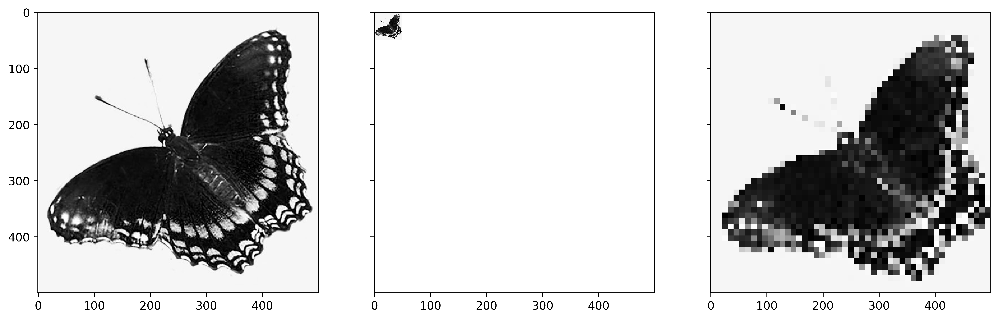

In [308]:
"""Upsample Nearest Neighbor Implementation"""
image_up_nn = upsample_image(image_sm, image.shape, interp_nn)
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 7), dpi=600, sharex=True, sharey=True)
ax[0].imshow(image, cmap="gray")
ax[1].imshow(image_sm, cmap="gray")
ax[2].imshow(image_up_nn, cmap="gray")

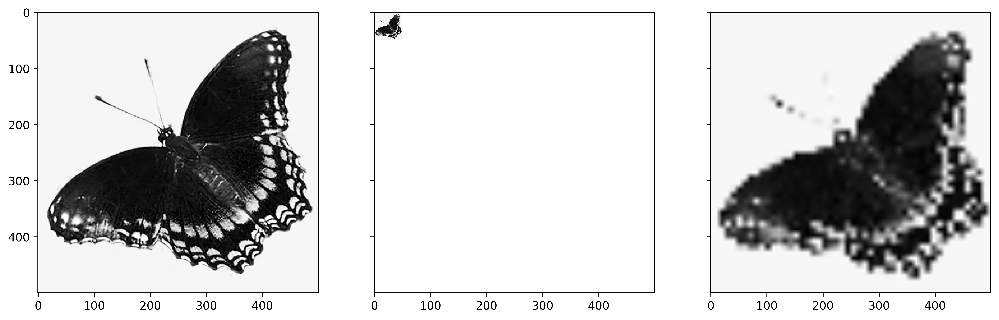

In [309]:
"""Upsample Bilinear Implementation"""
image_up_bil = upsample_image(image_sm, image.shape, interp_bilinear)
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 7), dpi=600, sharex=True, sharey=True)
ax[0].imshow(image, cmap="gray")
ax[1].imshow(image_sm, cmap="gray")
ax[2].imshow(image_up_bil, cmap="gray")

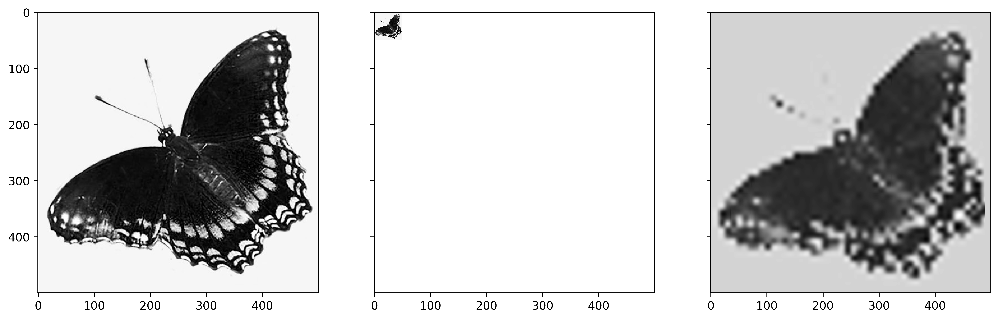

In [310]:
"""Upsample Bicubic Implementation"""
image_up_bic = upsample_image(image_sm, image.shape, interp_bicubic)
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 7), dpi=600, sharex=True, sharey=True)
ax[0].imshow(image, cmap="gray")
ax[1].imshow(image_sm, cmap="gray")
ax[2].imshow(image_up_bic, cmap="gray")

In [311]:
"""Downsample Implementation"""
"""We follow the same steps as done in Upsampling with just the changes in the target shape"""
def downsample_image(image, target_shape, interp_fn):
    image_dw = np.zeros(target_shape)
    new_xs = np.linspace(0, image.shape[1]-1, 
                         target_shape[1], endpoint=True)
    new_ys = np.linspace(0, image.shape[0]-1, 
                         target_shape[0], endpoint=True)
    for ix, new_x in np.ndenumerate(new_xs):
        for iy, new_y in np.ndenumerate(new_ys):
            image_dw[iy, ix] = interp_fn(image, new_x, new_y)
    return image_dw

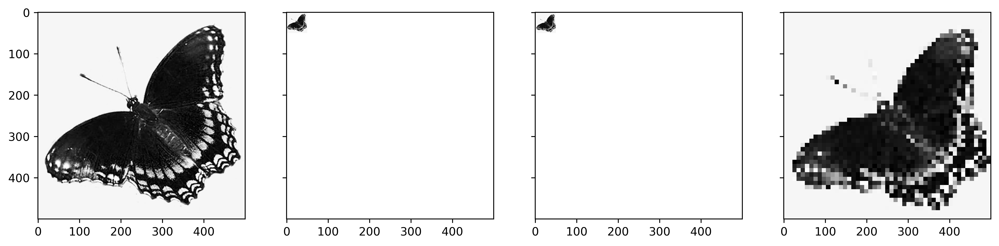

In [312]:
"""Downsampling using Nearest Neighbor"""
image_dw_nn = downsample_image(image_up_nn, image_sm.shape, interp_nn)
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(15, 7), dpi=600, sharex=True, sharey=True)
ax[0].imshow(image, cmap="gray")
ax[1].imshow(image_sm, cmap="gray")
ax[2].imshow(image_dw_nn, cmap="gray")
ax[3].imshow(image_up_nn, cmap="gray")

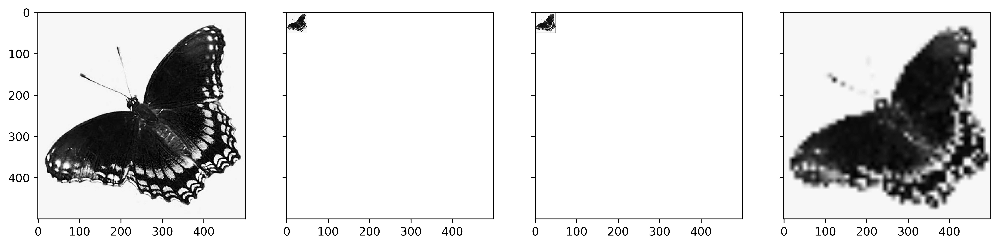

In [313]:
"""Downsampling using Bilinear"""
image_dw_bil = downsample_image(image_up_bil, image_sm.shape, interp_bilinear)
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(15, 7), dpi=600, sharex=True, sharey=True)
ax[0].imshow(image, cmap="gray")
ax[1].imshow(image_sm, cmap="gray")
ax[2].imshow(image_dw_bil, cmap="gray")
ax[3].imshow(image_up_bil, cmap="gray")

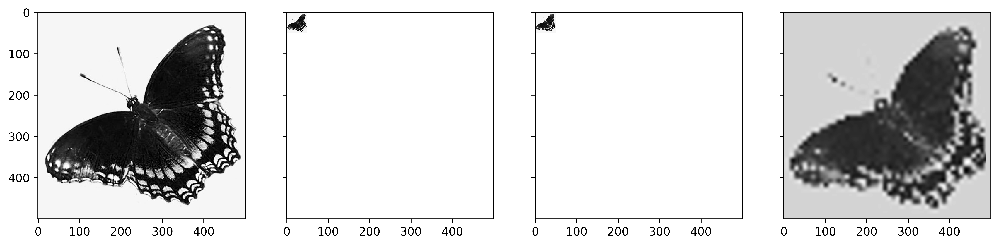

In [314]:
"""Downsampling using Bicubic"""
image_dw_bic = downsample_image(image_up_bic, image_sm.shape, interp_bicubic)
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(15, 7), dpi=600, sharex=True, sharey=True)
ax[0].imshow(image, cmap="gray")
ax[1].imshow(image_sm, cmap="gray")
ax[2].imshow(image_dw_bic, cmap="gray")
ax[3].imshow(image_up_bic, cmap="gray")

### P1.2.2 Upsampling with Fourier Transforms

One can also upsample images using a Fourier Transform using a technique known as *zero padding* ([here is a link](https://dsp.stackexchange.com/a/745) to a surprisingly succinct discussion of the rationale behind this approach from Stack Exchange). The idea behind zero padding is to (1) Fourier Transform your signal, (2) add zero-valued elements to the signal in frequency space (thereby making the vector or matrix larger without adding any new frequency components) and (3) transforming back.

You will be using the numpy `np.fft.fft2` to compute a Fourier Transform of an image and upsample it; do not implement the Fast Fourier Transform yourself. One thing you will notice in your implementation is that using the FFT implementation provided by numpy results in most of the "mass" in frequency space near the corner of the images (see my code below for an example). Using the ideas discussed in class (the Nyquist Limit and the Wagon Wheel Effect) **explain in words why the four corners of the frequency-space image are where most of the intensity is located**. *Hint*: for a discrete Fourier Transform, there are no explicitly "negative frequencies". How are frequencies above the Nyquist Limit related to  the "negative frequencies" we would expect to see when taking a continuous Fourier Transform?

**Implement image interpolation using zero-padding**. Once again, if your interpolation is successful, downsizing your interpolated image should result in the original, smaller image. Consult [the numpy FFT documentation](https://numpy.org/doc/stable/reference/routines.fft.html) for details on the implementation. You will find that the `np.fft.fftshift` function will be useful here. Once again, you might find it easier to begin by using this approach on a 1D signal and then extending that code to support a 2D image. How do you know that your upsampling procedure worked? What happens if you downsample the image again?

Compare the frequency-space representations of the Fourier Transform upsampled image to the upsampled images you generated with the other upsampling kernels. What do you observe? Is this behavior expected? Compare this to the frequency-space representation of the original image.

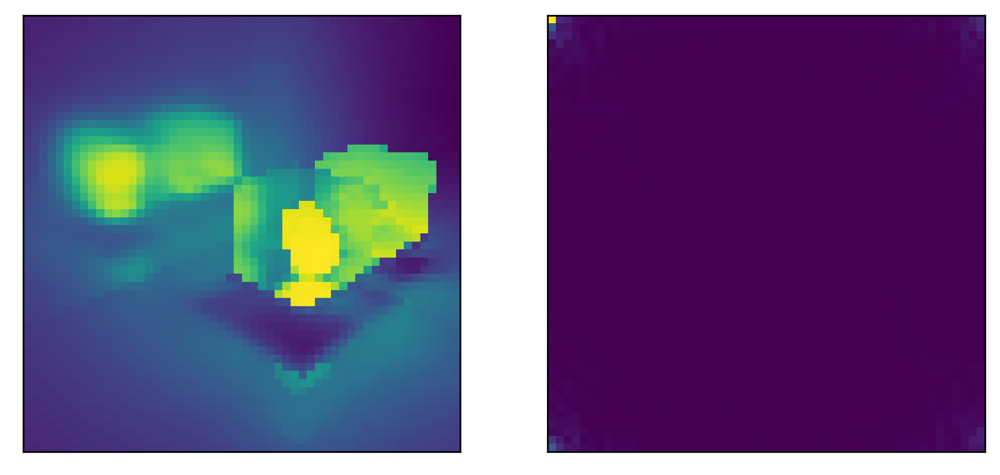

In [317]:
"""Example Implementation of FFT already given"""
image = load_image("light_cubes_sm.png")[:, :, 0]
image_sm = image[::10, ::10]
fig = plt.figure(figsize=(8, 4), dpi=300)
ax = plt.subplot(1, 2, 1)
ax.imshow(image_sm)
ax.set_xticks([])
ax.set_yticks([])
ax = plt.subplot(1, 2, 2)
ax.imshow(np.abs(np.fft.fft2(image_sm)))
ax.set_xticks([])
ax.set_yticks([])
None

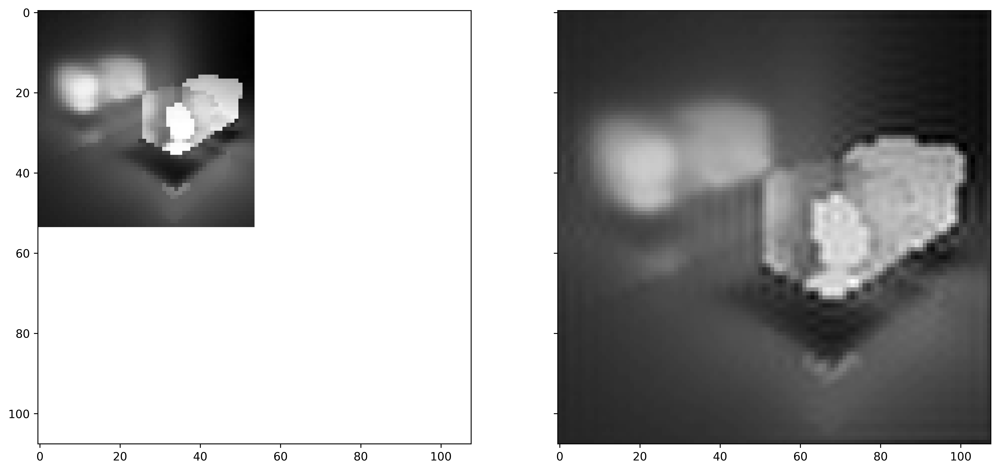

In [318]:
image = load_image("light_cubes_sm.png")[:, :, 0]
image_sm = image[::10, ::10]

"""Fourier Upsampling Implementation"""
def fourier_upsampling(image, zoom_scale):
    height, width = image.shape

    """We pad zeros to the four corners of the upscaled image"""
    left = np.ceil((zoom_scale - 1) * width / 2).astype(int)
    right = np.floor((zoom_scale - 1) * width / 2).astype(int)
    top = np.ceil((zoom_scale - 1) * height / 2).astype(int)
    bottom = np.floor((zoom_scale - 1) * height / 2).astype(int)

    """Fourier transformation of the smaller image"""
    ft = np.fft.fftshift(np.fft.fft2(image))
    
    """Zero Padding"""
    ft = np.pad(ft, [(top, bottom), (left, right)], 'constant', constant_values=0+0j)
    
    """Inverse Fourier Transformation"""
    ift = np.fft.ifft2(np.fft.ifftshift(ft))

    """To maintain real part of image"""
    if np.isrealobj(image):
        ift = np.real(ift)

    """Preserving original samples"""
    ift *= z * z

    """To avoid overflow of values"""
    if np.issubdtype(image.dtype, np.integer):
        value = np.iinfo(image.dtype)
        ift = np.round(ift)
    else:
        value = np.finfo(image.dtype)
    ift = np.clip(ift, value.min, value.max)

    return ift.astype(image.dtype)

image_up_ft = fourier_zoom(image_sm, 2)
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 7), dpi=600, sharex=True, sharey=True)
ax[0].imshow(image_sm, cmap="gray")
ax[1].imshow(image_up_ft, cmap="gray")


## P1.3 Hybrid Images (Contest)

In class, we discussed *hybrid images* in which the low-frequency components of one image are added to the high-frequency components of another and added together to make an image that looks like their different components up close and from far away. See the [Hybrid Images paper](https://stanford.edu/class/ee367/reading/OlivaTorralb_Hybrid_Siggraph06.pdf) for more details about the original research. 

Here, you are asked to implement a simplified version of the Hybrid Images work. We will vote as a class on the different submissions and pick out our favorites (though the vote will have no consequence on your grade). **If you would like me not to include your submision in the "contest" please say so in your writeup.**

Steps for completion:

1. Choose two images you intend to combine to form your *hybrid image*.
2. Implement a low-pass filter (using a Gaussian Blur: $g_{\sigma_1}$) and a high-pass filter (1 minus a Gaussian Blurred image: $1 - g_{\sigma_2}$). Apply the low-pass filter to one image and the high-pass filter to the other and average the two together. You may need to experiment with parameters $\sigma_1$ and $\sigma_2$.
3. **Generate a Gaussian image pyramid** from your newly constructed hybrid image. Combine all images into a single image as follows (without annotations): <img src="image_pyramid.png" alt="Image Pyramid" style="width: 400px;"/>

You do not need to implement the Laplacian image pyramid now, but you will likely need it again later on in the course, so it might be worth it to implement it now so that you have such a function when you need it.

In [328]:
"""Implementation of Gaussian filter"""
def gaussian_filter(rows, cols, sigma, high_pass=True):
    I = int(rows/2) + 1 if rows % 2 == 1 else int(rows/2)
    J = int(cols/2) + 1 if cols % 2 == 1 else int(cols/2)
    def gaussian(i,j):
        coeff = math.exp(-1.0 * ((i - I)**2 + (j - J)**2) / (2 * sigma**2))
        return 1 - coeff if high_pass else coeff
    return np.array([[gaussian(i,j) for j in range(cols)] for i in range(rows)])

"""Implementing Direct Fourier Transform"""
def direct_ft(image, filters):
    shift_ft = fftshift(fft2(image))
    filter_ft = shift_ft * filters
    return ifft2(ifftshift(filter_ft))

"""Implementation of low pass filter"""
def low_pass_filter(image, sigma):
    n,m = image.shape
    return direct_ft(image, gaussian_filter(n, m, sigma, high_pass=False))

"""Implementation of high pass filter"""
def high_pass_filter(image, sigma):
    n,m = image.shape
    return direct_ft(image, gaussian_filter(n, m, sigma, high_pass=True))

"""Implementing high pass of image 1 and low pass of image 2"""
def hybrid_image(image1, image2, sig1, sig2):
    hp = high_pass_filter(image1, sig1)
    lp = low_pass_filter(image2, sig2)
    return hp + lp

img1 = load_image("einstein.png")[:, :, 0]
img2 = load_image("marilyn.png")[:, :, 0]
image_hyb = hybrid_image(img1, img2, 25, 10)
mi.imsave("hybrid_image.png", numpy.real(image_hyb), cmap = "gray")

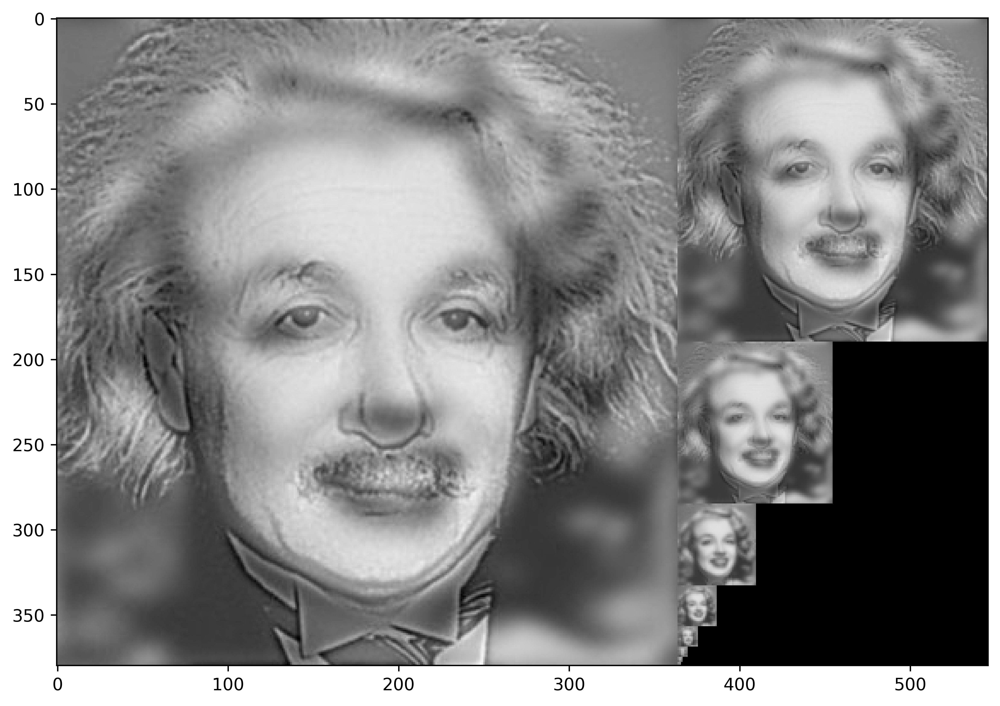

In [330]:
"""Gaussian Pyramid Implementation of the Hybrid Image"""
image = load_image("hybrid_image.png")[:, :, :]
rows, cols, dim = image.shape
image_pyramid = tuple(pyramid_gaussian(image, downscale=2, multichannel=True))

gaussian_pyd_image = np.zeros((rows, cols + cols // 2, 3), dtype=np.double)

gaussian_pyd_image[:rows, :cols, :] = image_pyramid[0]

row_inc = 0
for p in image_pyramid[1:]:
    num_row, num_col = p.shape[:2]
    gaussian_pyd_image[row_inc:row_inc + num_row, cols:cols + num_col] = p
    row_inc += num_row

plt.figure(figsize=(15, 7), dpi=600)
plt.imshow(gaussian_pyd_image)
plt.show()